### import & data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from google.colab import output
!gdown --id 1u7B39EzMGnYBpqAs_42tY9XfH8gQcosH
!unzip /content/sunflower2daisy.zip

!pip install wandb
output.clear()

In [3]:
%cd /content/drive/MyDrive/Work_Share/f

/content/drive/.shortcut-targets-by-id/1hPMA1K_LEbWgkW44gTVTTTPj3cDkZEIY/Work_Share/f


In [4]:
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim.lr_scheduler as lr_scheduler
import torch
import itertools
import wandb

from tqdm import tqdm
import matplotlib.pyplot as plt
from utils.data import ImageDataset
from utils.utils import *
from models.generator import GeneratorResNet
from models.discriminator import Discriminator

### config

In [5]:
class CFG:
    data = '/content/sunflower2daisy'
    img_height = 256
    img_width = 256
    channels = 3
    model_folder = '/content/drive/MyDrive/Work_Share/f/1_1_15'
    epochs = 500
    lr = 0.0002
    b1 = 0.5
    b2 = 0.999
    n_residual_blocks = 9
    device = 'cuda'
    n_cpu = 2
    logger = True
    project_name = 'cycleGan'
    experiment_name = '1-1-15'
    id_name = '3bxcl2kn'
    interval_log_result = 5
    interval_save_cpkt = 50
    # resume = []
    resume = ['/content/drive/MyDrive/Work_Share/f/1_1_15/G_AB_450.pt',
              '/content/drive/MyDrive/Work_Share/f/1_1_15/G_BA_450.pt',
              '/content/drive/MyDrive/Work_Share/f/1_1_15/D_A_450.pt',
              '/content/drive/MyDrive/Work_Share/f/1_1_15/D_B_450.pt']

### dataloader

In [6]:
set_seed(9999)

transforms_ = [
    transforms.Resize(int(CFG.img_height*1.12), Image.BILINEAR),
    transforms.RandomCrop((CFG.img_height, CFG.img_width)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
]

dataloader = DataLoader(
    ImageDataset(CFG.data, transforms_=transforms_, unaligned=True),
    batch_size=1,
    shuffle=True,
    num_workers=CFG.n_cpu
)

val_dataloader = DataLoader(
    ImageDataset(CFG.data, transforms_=transforms_, unaligned=True, mode='test'),
    batch_size=5,
    shuffle=True,
    num_workers=CFG.n_cpu
)

Random seed set as 9999


### model

In [ ]:
input_shape = (CFG.channels, CFG.img_height, CFG.img_width) # (3,256,256)
n_residual_blocks = CFG.n_residual_blocks

G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)

G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)

G_AB = G_AB.to(CFG.device)
G_BA = G_BA.to(CFG.device)
D_A = D_A.to(CFG.device)
D_B = D_B.to(CFG.device)

criterion_GAN = nn.MSELoss()
criterion_cycle = nn.L1Loss()
criterion_identity = nn.L1Loss()

criterion_GAN.to(CFG.device)
criterion_cycle.to(CFG.device)
criterion_identity.to(CFG.device)

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=CFG.lr, betas=(CFG.b1,CFG.b2)
)

optimizer_D_A = torch.optim.Adam(
    D_A.parameters(), lr=CFG.lr, betas=(CFG.b1,CFG.b2)
)
optimizer_D_B = torch.optim.Adam(
    D_B.parameters(), lr=CFG.lr, betas=(CFG.b1,CFG.b2)
)

start_epoch = 0
if len(CFG.resume) == 4:
    G_AB, optimizer_G, start_epoch = load_checkpoint(G_AB, 'G_AB', optimizer_G, checkpoint_path=CFG.resume[0])
    G_BA, optimizer_G, start_epoch = load_checkpoint(G_BA, 'G_BA', optimizer_G, checkpoint_path=CFG.resume[1])
    D_A, optimizer_D_A, start_epoch = load_checkpoint(D_A, 'D_A', optimizer_D_A, checkpoint_path=CFG.resume[2])
    D_B, optimizer_D_B, start_epoch = load_checkpoint(D_B, 'D_B', optimizer_D_B, checkpoint_path=CFG.resume[3])

else:
    optimizer_G = torch.optim.Adam(
        itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=CFG.lr, betas=(CFG.b1,CFG.b2)
    )

    optimizer_D_A = torch.optim.Adam(
        D_A.parameters(), lr=CFG.lr, betas=(CFG.b1,CFG.b2)
    )
    optimizer_D_B = torch.optim.Adam(
        D_B.parameters(), lr=CFG.lr, betas=(CFG.b1,CFG.b2)
    )

Tensor = torch.cuda.FloatTensor if CFG.device=='cuda' else torch.Tensor


### training

Random seed set as 9999
Loaded checkpoint G_AB from epoch 450
Loaded checkpoint G_BA from epoch 450
Loaded checkpoint D_A from epoch 450
Loaded checkpoint D_B from epoch 450


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


100%|██████████| 250/250 [02:49<00:00,  1.48it/s]


 455


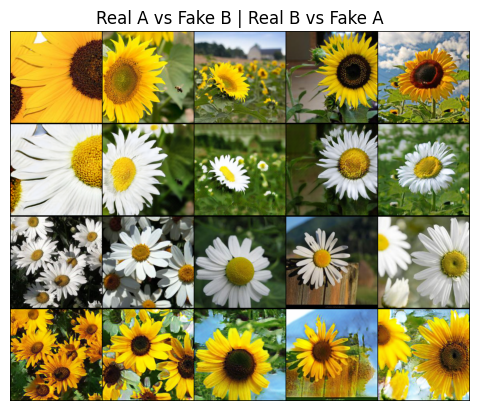

100%|██████████| 250/250 [02:50<00:00,  1.47it/s]


 460


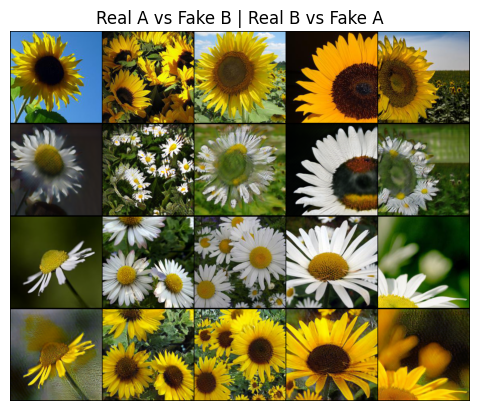

100%|██████████| 250/250 [02:50<00:00,  1.47it/s]


 465


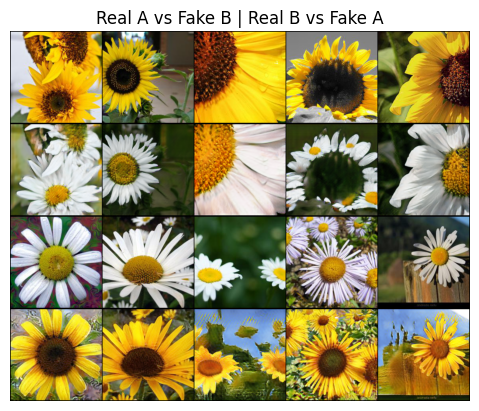

100%|██████████| 250/250 [02:50<00:00,  1.47it/s]


 470


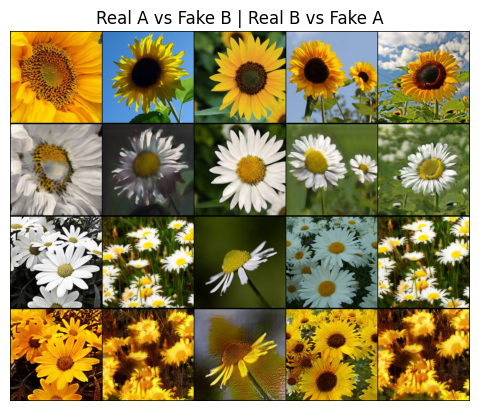

100%|██████████| 250/250 [02:50<00:00,  1.47it/s]


 475


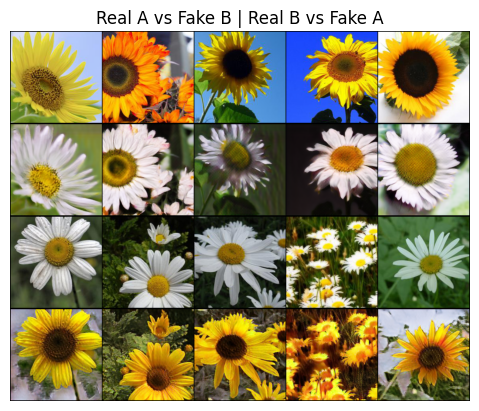

100%|██████████| 250/250 [02:50<00:00,  1.46it/s]


 480


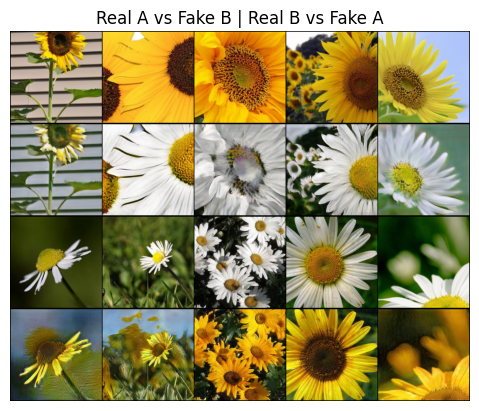

100%|██████████| 250/250 [02:50<00:00,  1.46it/s]


 485


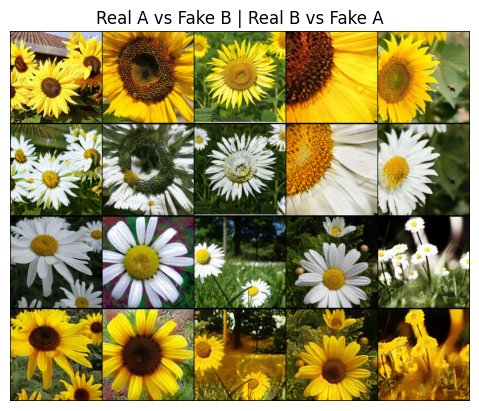

100%|██████████| 250/250 [02:50<00:00,  1.46it/s]


 490


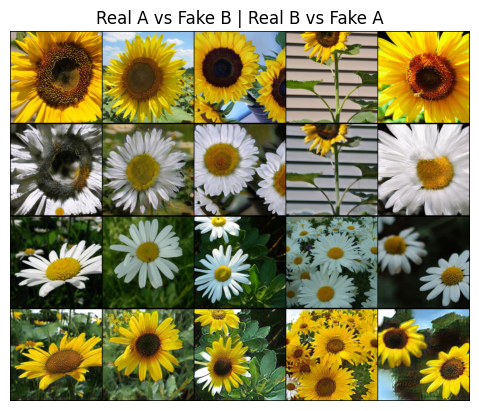

100%|██████████| 250/250 [02:50<00:00,  1.47it/s]


 495


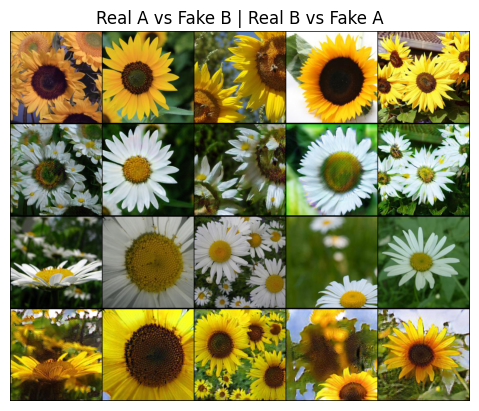

100%|██████████| 250/250 [02:50<00:00,  1.47it/s]


 500


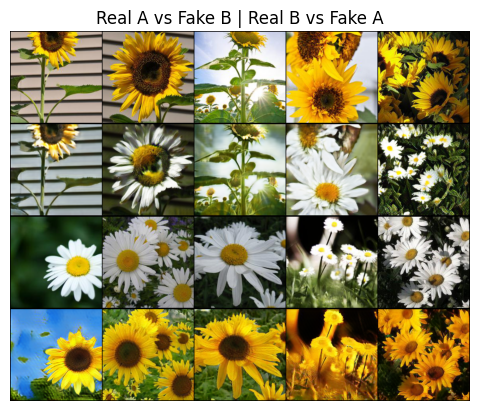

Checkpoint saved to /content/drive/MyDrive/Work_Share/f/1_1_15/G_AB_500.pt
Checkpoint saved to /content/drive/MyDrive/Work_Share/f/1_1_15/G_BA_500.pt
Checkpoint saved to /content/drive/MyDrive/Work_Share/f/1_1_15/D_A_500.pt
Checkpoint saved to /content/drive/MyDrive/Work_Share/f/1_1_15/D_B_500.pt


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
loss_DA,▇▇▅▇▅█▇▄▅█▄▆▄▅▅▅▆▅▅▆▇▆▅▇▄▇▅▅▄▆▄▇▅▅▃▆▁▃▄▆
loss_DB,▂▅▄█▂▃▆▂▆▆▂▆▅▄▄▄▅▃▃▃▃▅▃▆▄▃▂▃▁▄▄▇▃▂▂▇▄▄▁▄
loss_De,▄▆▅█▃▆▆▂▅▇▃▆▄▄▄▄▆▄▄▄▅▆▄▇▃▅▃▄▁▅▄▇▃▃▁▇▁▃▂▅
loss_GA,▃▃▂▁▄▂▅▄▂▄▄▁▄▂▄▂▄▁▃▂▂▄▅▂▅▄▅▃█▄▃▂▂▆▅▃▆▅▅▅
loss_GB,▃▄▃▃▄▁▅▅▆▂▇▂▇▅▅▅▄▄▄▄▃▄▄▄▇▃▆▇▇▄▅▃▅█▆▅▇▇▇▄
loss_Ge,▃▃▅▄▅▃▃▄▄▄▅▃█▃▄▃▃▃▂▄▂▃▃▂▄▄▄▄▅▂▂▁▁▄▁▂▃▆▄▃
loss_cycleA,▄▄▆▆▅▄▅▆█▇▆▃█▄▅▇▄▄▄▆▃▆▂▂▄▄▄▄▃▂▃▂▂▃▂▃▁▆▃▅
loss_cycleB,▄▄▇▅▆▅▃▄▄▄▅▅█▄▅▃▄▄▃▄▄▄▄▄▄▅▅▄▅▃▃▃▂▄▁▃▄▆▅▄
loss_idA,▄▅▅▄▅▄▃▄█▅▄▃▆▃▃▄▄▃▂▆▂▄▁▂▂▃▃▃▃▂▂▂▂▂▁▂▁▃▂▃
loss_idB,▆▄▅▄▄▄▂▄▃▃▄▄▄▃▃▂▃▃▃▃▂▃▄▂▃▃▂▁█▄▂▂▁▂▁▂▂▄▃▃


In [ ]:
if CFG.logger:
    if CFG.id_name is not None:
        wandb.init(id=CFG.id_name, project=CFG.project_name, resume="must")
    else:
        wandb.init(project=CFG.project_name, name=CFG.experiment_name)

    wandb.watch(G_AB, log="all")
    wandb.watch(G_BA, log="all")
    wandb.watch(D_A, log="all")
    wandb.watch(D_B, log="all")

for epoch in range(start_epoch, CFG.epochs):
    loss_DA = []
    loss_GA = []
    loss_cycleA = []
    loss_idA = []

    loss_DB = []
    loss_GB = []
    loss_cycleB = []
    loss_idB = []

    loss_De = []
    loss_Ge = []

    for i, batch in enumerate(tqdm(dataloader)):

        # Set model input
        real_A = batch['A'].type(Tensor)
        real_B = batch['B'].type(Tensor)

        # Adversarial ground truths
        valid = Tensor(np.ones((real_A.size(0), *D_A.output_shape))) # requires_grad = False. Default.
        fake = Tensor(np.zeros((real_A.size(0), *D_A.output_shape))) # requires_grad = False. Default.

# ----------------- Train Generators -----------------

        G_AB.train()
        G_BA.train()

        optimizer_G.zero_grad()

        # Identity Loss
        loss_id_A = criterion_identity(G_BA(real_A), real_A)
        loss_id_B = criterion_identity(G_AB(real_B), real_B)

        # G Loss
        fake_B = G_AB(real_A)
        loss_G_AB = criterion_GAN(D_B(fake_B), valid)
        fake_A = G_BA(real_B)
        loss_G_BA = criterion_GAN(D_A(fake_A), valid)

        # Cycle Loss
        recov_A = G_BA(fake_B)
        loss_cycle_A = criterion_cycle(recov_A, real_A)
        recov_B = G_AB(fake_A)
        loss_cycle_B = criterion_cycle(recov_B, real_B)

# ------> G Loss

        loss_G = 1*(loss_id_A + loss_id_B) + 1*(loss_G_AB + loss_G_BA) + 15*(loss_cycle_A + loss_cycle_B)

        loss_G.backward()
        optimizer_G.step()

# ----------------- Train Discriminator A -----------------

        optimizer_D_A.zero_grad()

        loss_real = criterion_GAN(D_A(real_A), valid)
        loss_fake = criterion_GAN(D_A(fake_A.detach()), fake)

        loss_D_A = (loss_real + loss_fake)

        loss_D_A.backward()
        optimizer_D_A.step()

# ----------------- Train Discriminator B -----------------

        optimizer_D_B.zero_grad()

        loss_real = criterion_GAN(D_B(real_B), valid)
        loss_fake = criterion_GAN(D_B(fake_B.detach()), fake)

        loss_D_B = (loss_real + loss_fake)

        loss_D_B.backward()
        optimizer_D_B.step()

# ------> D Loss

        loss_D = (loss_D_A + loss_D_B)

# ----------------- log loss of batch -----------------

        loss_DA.append(loss_D_A.item())
        loss_GA.append(loss_G_AB.item())
        loss_cycleA.append(loss_cycle_A.item())
        loss_idA.append(loss_id_A.item())

        loss_DB.append(loss_D_B.item())
        loss_GB.append(loss_G_BA.item())
        loss_cycleB.append(loss_cycle_B.item())
        loss_idB.append(loss_id_B.item())

        loss_De.append(loss_D.item())
        loss_Ge.append(loss_G.item())

# ----------------- Show Progress -----------------

    if CFG.logger:
        metrics = {
            'epoch': epoch+1,
            'loss_DA': sum(loss_DA) / len(loss_DA),
            'loss_GA': sum(loss_GA) / len(loss_GA),
            'loss_cycleA': sum(loss_cycleA) / len(loss_cycleA),
            'loss_idA': sum(loss_idA) / len(loss_idA),
            'loss_DB': sum(loss_DB) / len(loss_DB),
            'loss_GB': sum(loss_GB) / len(loss_GB),
            'loss_cycleB': sum(loss_cycleB) / len(loss_cycleB),
            'loss_idB': sum(loss_idB) / len(loss_idB),
            'loss_De': sum(loss_De) / len(loss_De),
            'loss_Ge': sum(loss_Ge) / len(loss_Ge)
        }

        wandb.log(metrics)

    if (epoch+1) % CFG.interval_log_result == 0:
        print(f'\n {epoch+1}')
        """show a generated sample from the test set"""
        imgs = next(iter(val_dataloader))
        G_AB.eval()
        G_BA.eval()
        real_A = imgs['A'].type(Tensor) # A : monet
        fake_B = G_AB(real_A).detach()
        real_B = imgs['B'].type(Tensor) # B : photo
        fake_A = G_BA(real_B).detach()
        # Arange images along x-axis
        real_A = make_grid(real_A, nrow=5, normalize=True)
        fake_B = make_grid(fake_B, nrow=5, normalize=True)
        real_B = make_grid(real_B, nrow=5, normalize=True)
        fake_A = make_grid(fake_A, nrow=5, normalize=True)
        # Arange images along y-axis
        image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1)
        plt.imshow(image_grid.cpu().permute(1,2,0))
        plt.title('Real A vs Fake B | Real B vs Fake A')
        plt.axis('off')
        plt.show(block=True);

    if (epoch+1) % CFG.interval_save_cpkt == 0:
        save_checkpoint(G_AB, 'G_AB', optimizer_G, epoch+1, loss_GA, CFG)
        save_checkpoint(G_BA, 'G_BA', optimizer_G, epoch+1, loss_GB, CFG)
        save_checkpoint(D_A, 'D_A', optimizer_D_A, epoch+1, loss_DA, CFG)
        save_checkpoint(D_B, 'D_B', optimizer_D_B, epoch+1, loss_DB, CFG)

wandb.finish()

### predict

Random seed set as 0


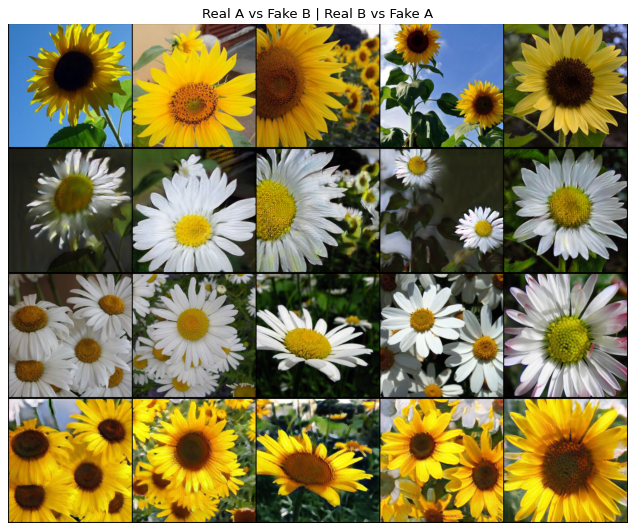

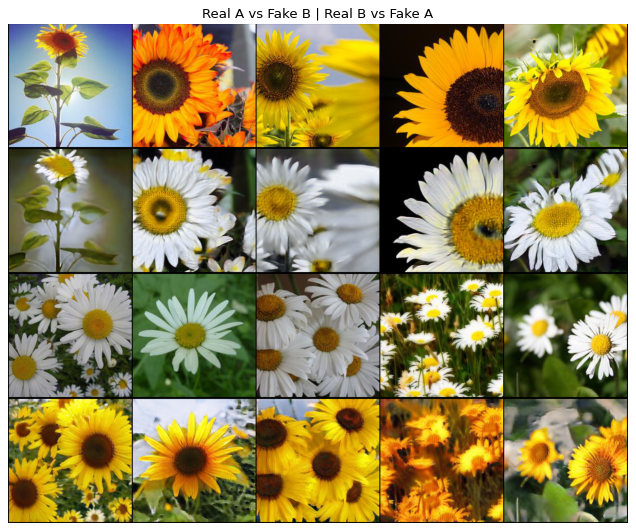

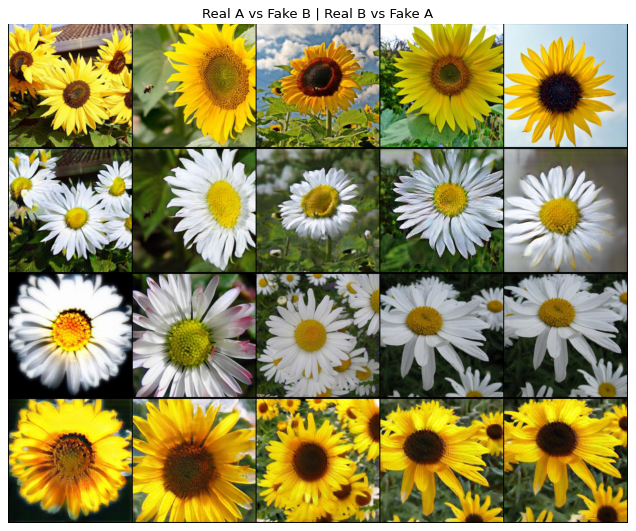

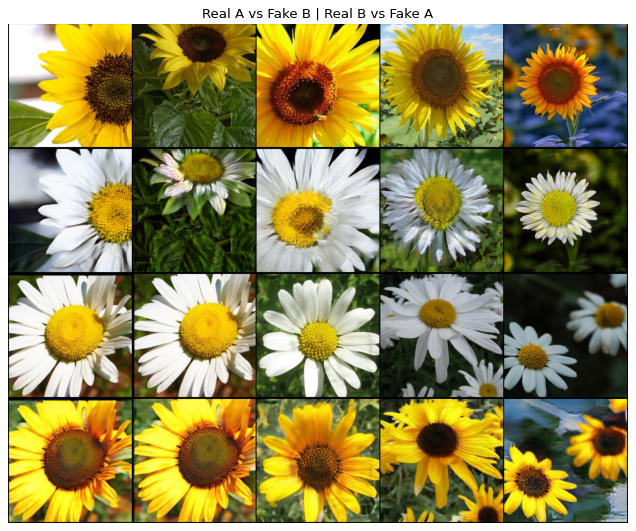

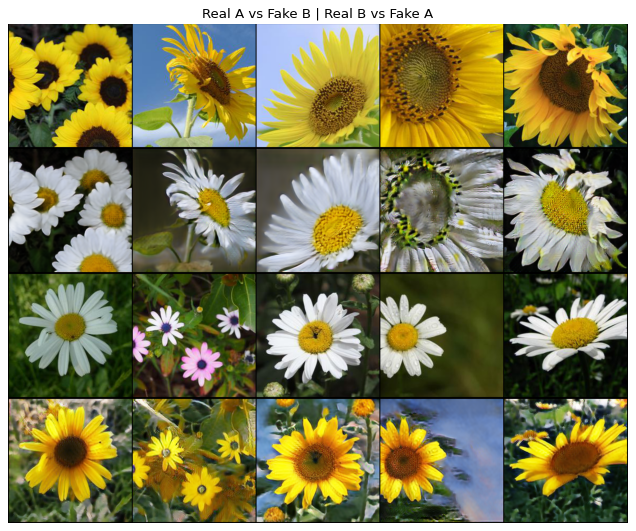

...

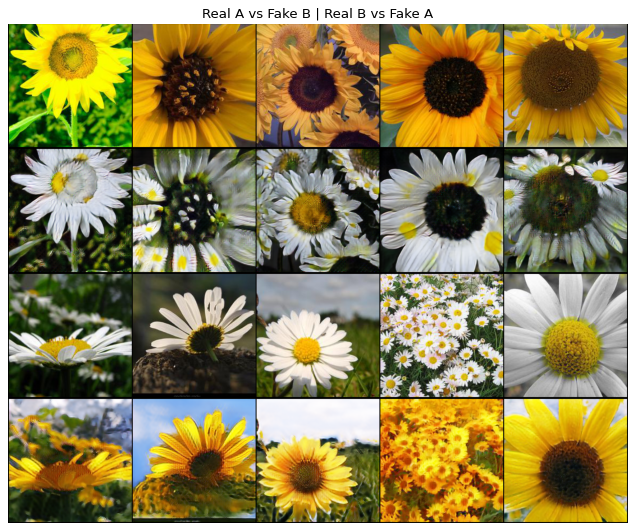

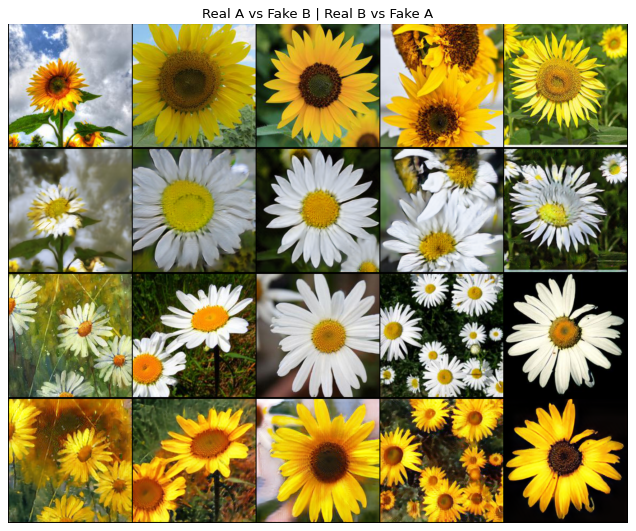

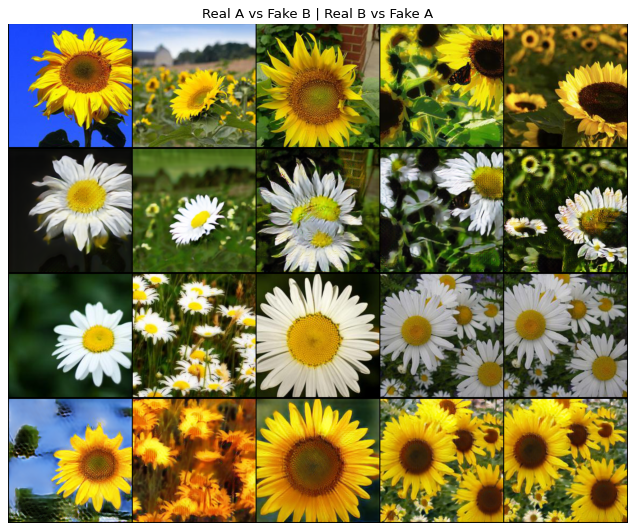

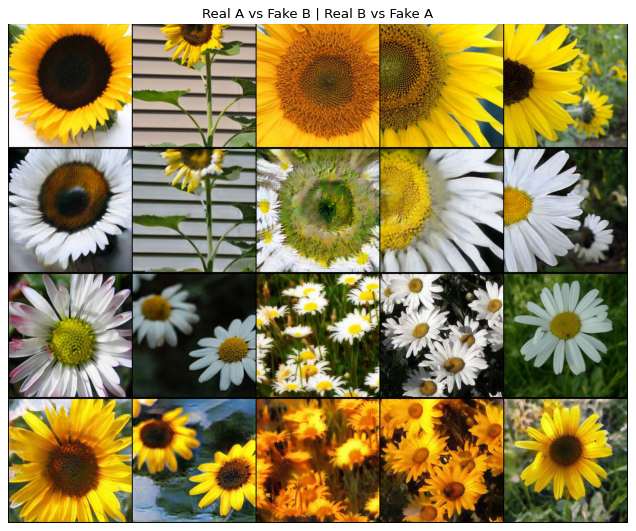

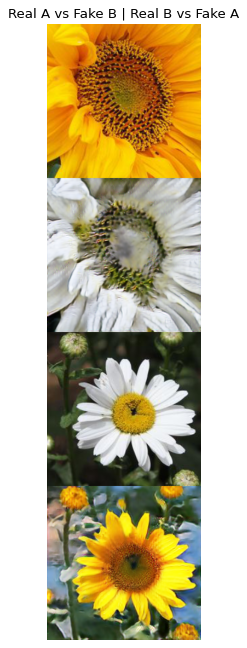

In [30]:
set_seed(0)

G_AB_cpkt = torch.load(f'/content/drive/MyDrive/Work_Share/f/1_1_15/G_AB_{350}.pt')
G_BA_cpkt = torch.load(f'/content/drive/MyDrive/Work_Share/f/1_1_15/G_BA_{350}.pt')

G_AB.load_state_dict(G_AB_cpkt['model_state_dict'])
G_BA.load_state_dict(G_BA_cpkt['model_state_dict'])

G_AB.to(CFG.device)
G_BA.to(CFG.device)

n = 10
for i in range(n):
    imgs = next(iter(val_dataloader))
    G_AB.eval()
    G_BA.eval()
    real_A = imgs['A'].type(Tensor) # A : sunflower
    fake_B = G_AB(real_A).detach()
    real_B = imgs['B'].type(Tensor) # B : daisy
    fake_A = G_BA(real_B).detach()
    # Arange images along x-axis
    real_A = make_grid(real_A, nrow=5, normalize=True)
    fake_B = make_grid(fake_B, nrow=5, normalize=True)
    real_B = make_grid(real_B, nrow=5, normalize=True)
    fake_A = make_grid(fake_A, nrow=5, normalize=True)
    # Arange images along y-axis
    image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1)
    plt.figure(figsize=(20, 20), dpi=100)

#     plt.subplot(n, 1, i+1)
    plt.imshow(image_grid.cpu().permute(1,2,0))
    plt.title('Real A vs Fake B | Real B vs Fake A')
    plt.axis('off')
    plt.show();